# Person+Helmet — yolo26m_merged_150e single vs SAHI (minimal, Ultralytics guide)

Snippet from https://docs.ultralytics.com/guides/sahi-tiled-inference - `AutoDetectionModel` + `get_sliced_prediction`. No GREEDYNMM/IOS, no match_boxes.

| mode | weight | classes |
|---|---|---|
| single | `runs/detect/yolo26m_merged_150e/weights/best.pt` | `0:person` + `1:helmet` |
| SAHI | `runs/detect/yolo26m_merged_150e/weights/best.pt` (same) | `0:person` + `1:helmet` |

Valid split: `data/css-data/valid` 114 images (all 640x640). Helmet = `Hardhat` class `0` in CSS labels -> 42 helmet images for viz. SAHI `slice 320 overlap 0.25` as in code.


## 1 - Setup


In [1]:
from pathlib import Path
import random, time
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, cv2
from PIL import Image
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

sns.set_theme(style="whitegrid")
random.seed(42)

try:
    REPO_ROOT = Path(__file__).resolve().parents[2]
except NameError:
    cur = Path.cwd()
    REPO_ROOT = cur
    for cand in [cur, cur.parent, cur.parent.parent]:
        if (cand / "YOLO8.ipynb").exists() or (cand / ".git").exists():
            REPO_ROOT = cand; break
print("REPO_ROOT:", REPO_ROOT)
print("ultralytics:", __import__("ultralytics").__version__)
print("sahi:", __import__("sahi").__version__)


REPO_ROOT: e:\work\P0-safety
ultralytics: 8.4.127
sahi: 0.12.6


## 2 - Data - valid 114


In [2]:
VALID_DIR = REPO_ROOT / "data" / "css-data" / "valid"
IMGS = sorted((VALID_DIR / "images").glob("*.jpg"))
print(f"valid images: {len(IMGS)}  exists={VALID_DIR.exists()}")
if IMGS:
    with Image.open(IMGS[0]) as im:
        print("example size:", im.size, IMGS[0].name[:40])


valid images: 114  exists=True
example size: (640, 640) -1079-_png_jpg.rf.19092a3937930012f9fd9c


## 3 - Models


In [3]:
WEIGHT = REPO_ROOT / "runs" / "detect" / "yolo26m_merged_150e" / "weights" / "best.pt"
KEEP = [0, 1]  # 0:person 1:helmet
PERSON_ID, HELMET_ID = 0, 1
print(f"yolo26m-merged {WEIGHT} exists={WEIGHT.exists()} keep={KEEP}  -> ", end="")
if WEIGHT.exists():
    print(YOLO(str(WEIGHT)).names)
# alias for backward compat
MODELS = [("yolo26m-merged", WEIGHT, KEEP)]


yolo26m-merged e:\work\P0-safety\runs\detect\yolo26m_merged_150e\weights\best.pt exists=True keep=[0, 1]  -> {0: 'person', 1: 'helmet', 2: 'gloves', 3: 'boots', 4: 'vest', 5: 'no-helmet', 6: 'no-gloves', 7: 'no-boots', 8: 'no-vest'}


## 4 - SAHI - Ultralytics guide snippet (yolo26m_merged_150e single weight)

https://docs.ultralytics.com/guides/sahi-tiled-inference - `get_sliced_prediction(img, model, 320, 320, 0.25, 0.25)` + `AutoDetectionModel.from_pretrained`.

Same weight for single and SAHI: `runs/detect/yolo26m_merged_150e/weights/best.pt` predicting `0:person` + `1:helmet`.


In [4]:
SLICE = 320
OVERLAP = 0.25
CONF = 0.25
_sahi = {}

def get_model(weight, conf=CONF):
    import torch
    k = str(weight)
    if k in _sahi:
        return _sahi[k]
    m = AutoDetectionModel.from_pretrained(
        model_type="ultralytics", model_path=str(weight),
        confidence_threshold=conf, device="cuda:0" if torch.cuda.is_available() else "cpu",
    )
    _sahi[k] = m
    return m

# Demo on one valid image - single-pass vs SAHI (person+helmet, same weight)
if IMGS:
    p = random.choice(IMGS)
    print("demo image:", p.name)
    yolo = YOLO(str(WEIGHT))
    r = yolo(str(p), verbose=False, conf=CONF)[0]
    n_p_single = sum(1 for c in r.boxes.cls.tolist() if int(c) == PERSON_ID) if r.boxes is not None else 0
    n_h_single = sum(1 for c in r.boxes.cls.tolist() if int(c) == HELMET_ID) if r.boxes is not None else 0
    sm = get_model(WEIGHT, CONF)
    res = get_sliced_prediction(str(p), sm, slice_height=SLICE, slice_width=SLICE, overlap_height_ratio=OVERLAP, overlap_width_ratio=OVERLAP, perform_standard_pred=True)
    n_p_sahi = sum(1 for pr in res.object_prediction_list if int(pr.category.id) == PERSON_ID)
    n_h_sahi = sum(1 for pr in res.object_prediction_list if int(pr.category.id) == HELMET_ID)
    print(f"single  person={n_p_single} helmet={n_h_single}")
    print(f"SAHI    person={n_p_sahi} helmet={n_h_sahi}")


demo image: youtube-226_jpg.rf.dd9d045ca17155289bcebe722e8a86e9.jpg
Performing prediction on 9 slices.
single  person=0 helmet=0
SAHI    person=0 helmet=0


## 5 · Visuals — 42 helmet images, 2 cols (single | SAHI) — yolo26m_merged_150e person+helmet


helmet images: 42/114 (valid) -> 42 figures  (yolo26m_merged_150e single vs SAHI)
Performing prediction on 9 slices.


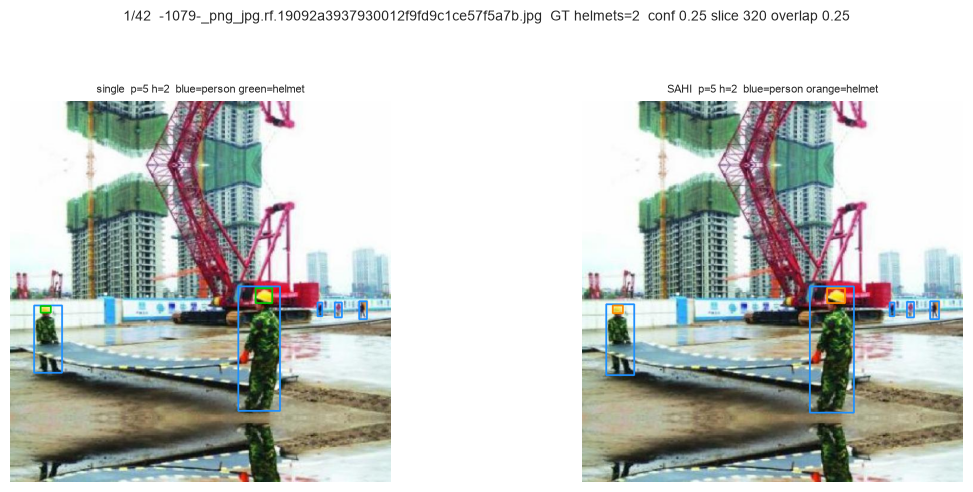

Performing prediction on 9 slices.


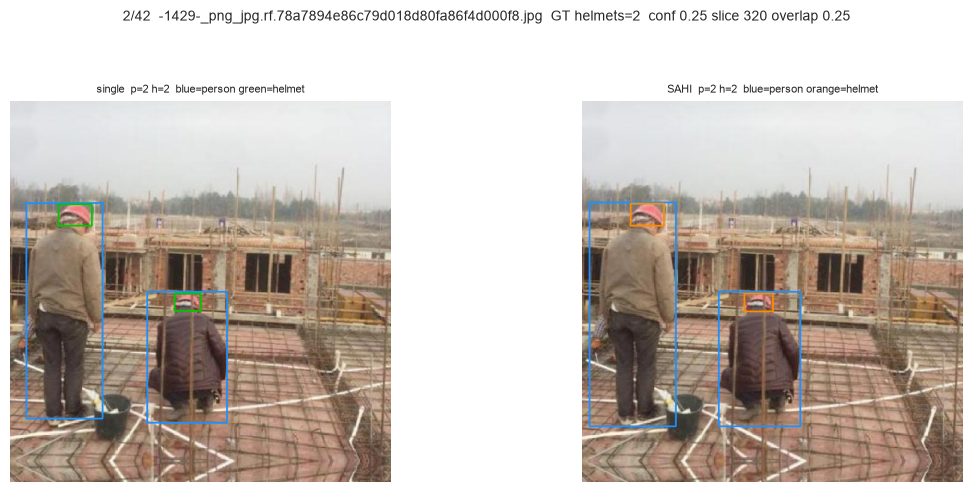

Performing prediction on 9 slices.


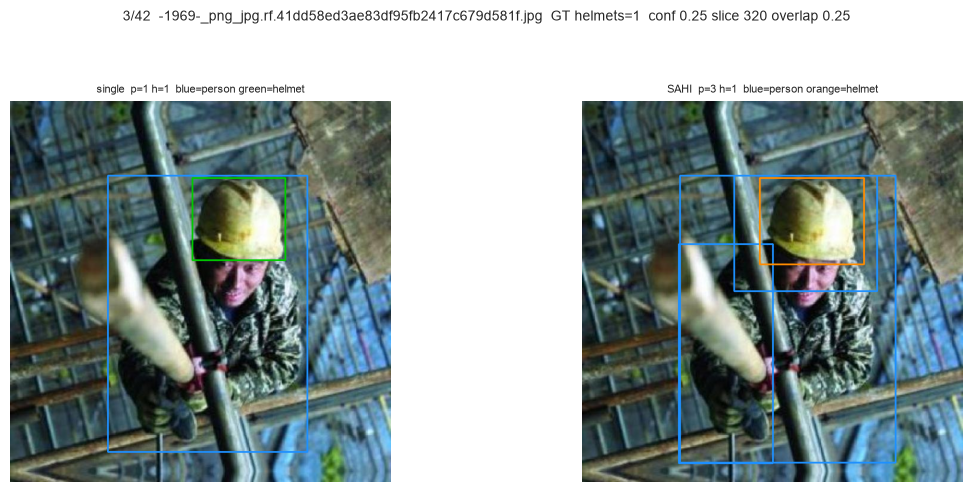

Performing prediction on 9 slices.


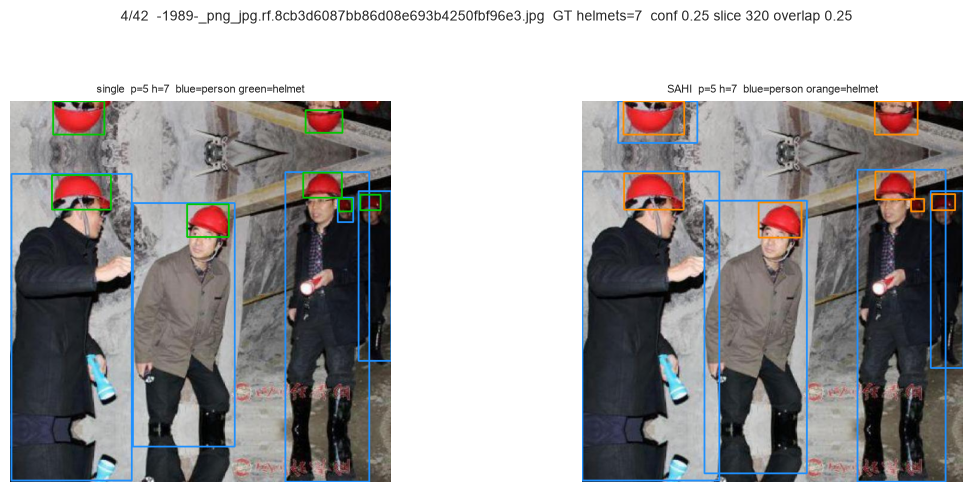

Performing prediction on 9 slices.


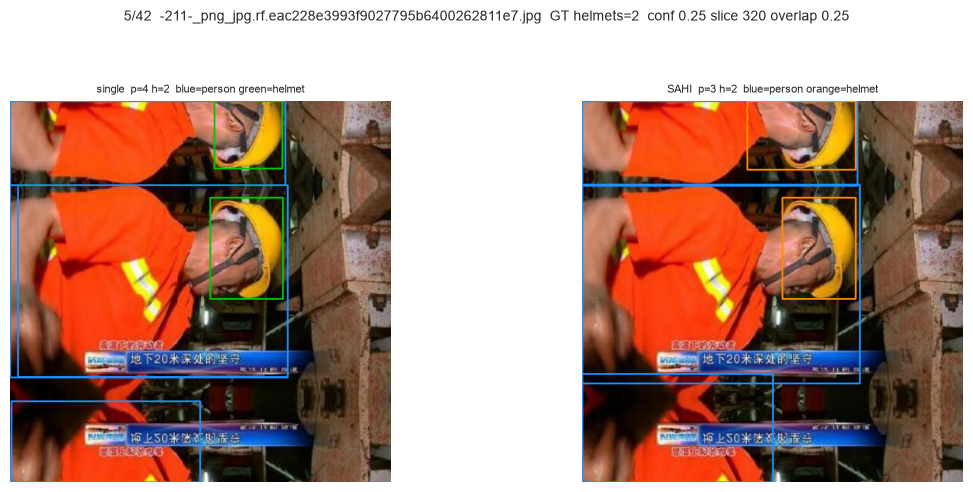

Performing prediction on 9 slices.


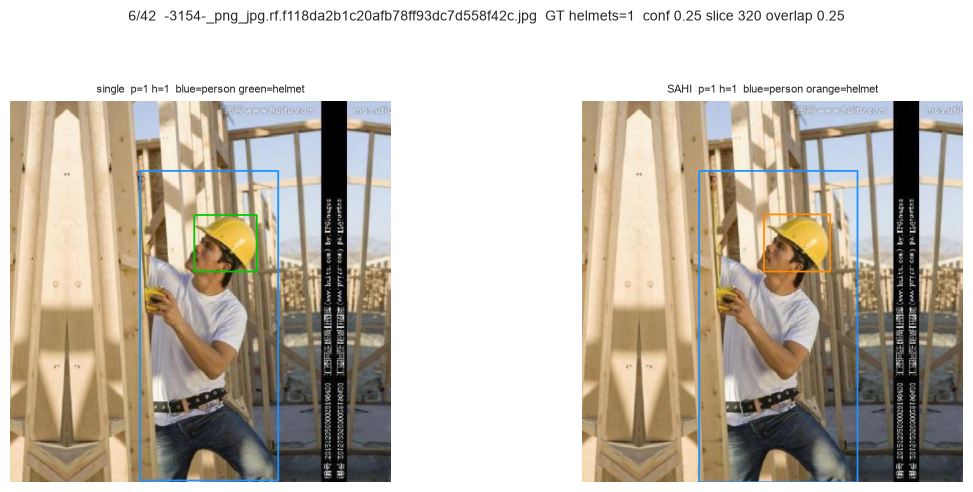

Performing prediction on 9 slices.


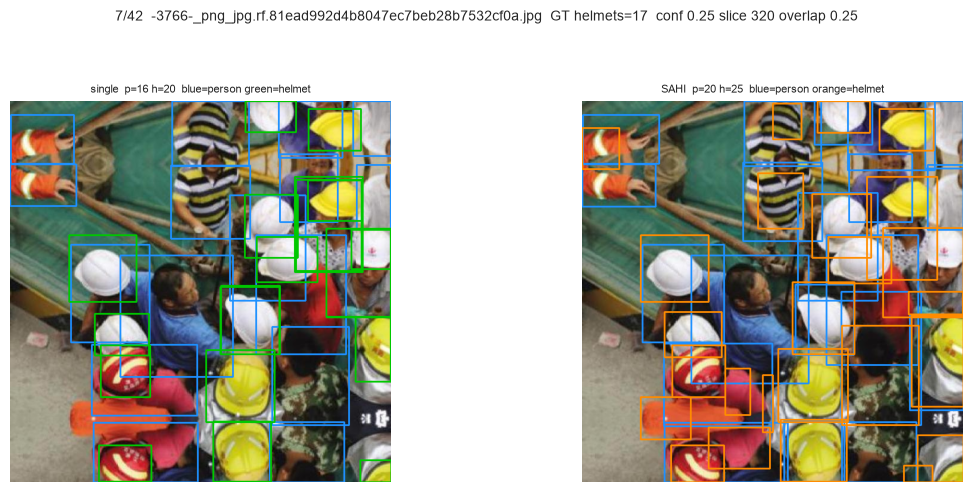

Performing prediction on 9 slices.


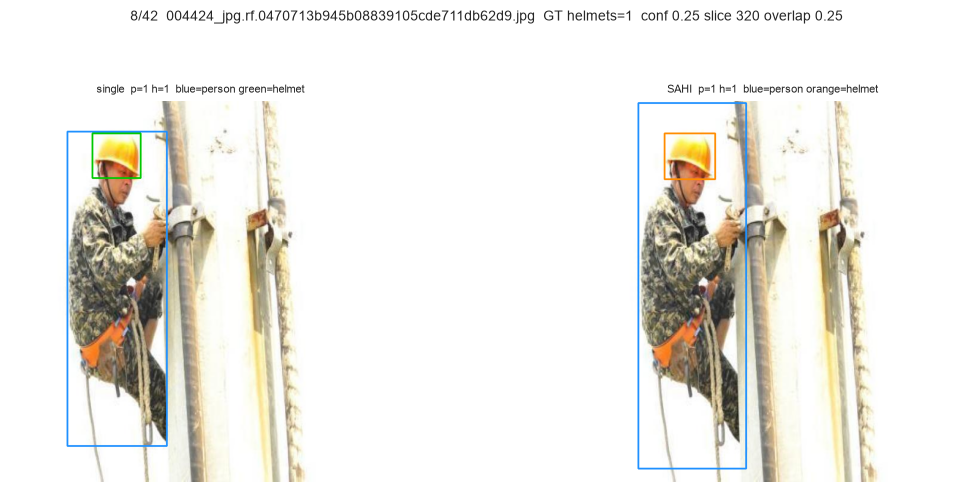

Performing prediction on 9 slices.


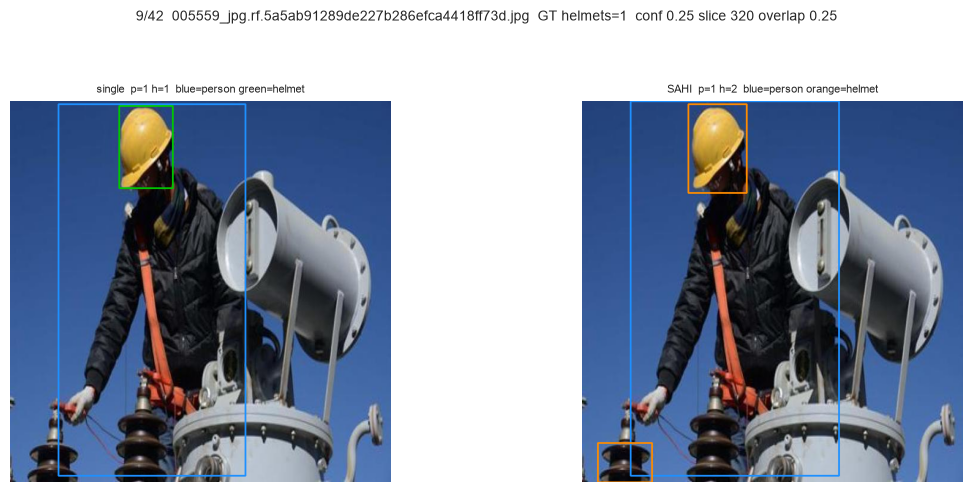

Performing prediction on 9 slices.


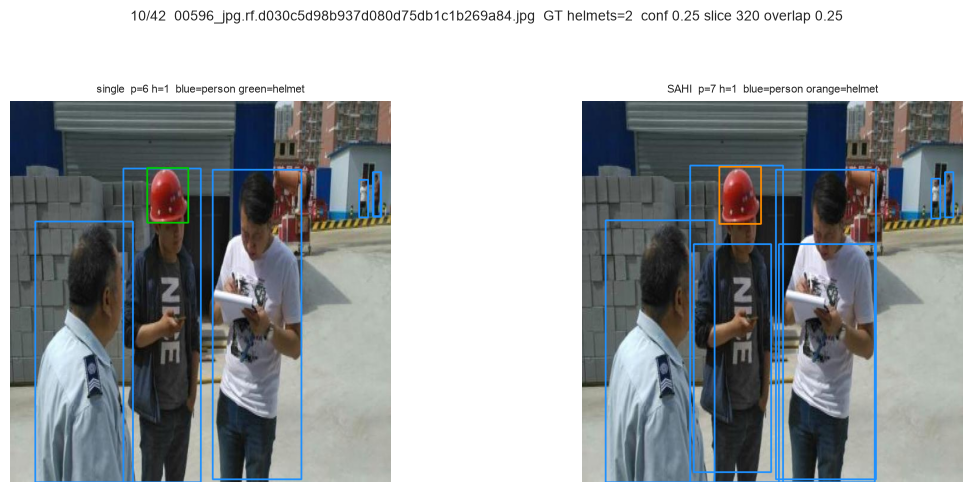

Performing prediction on 9 slices.


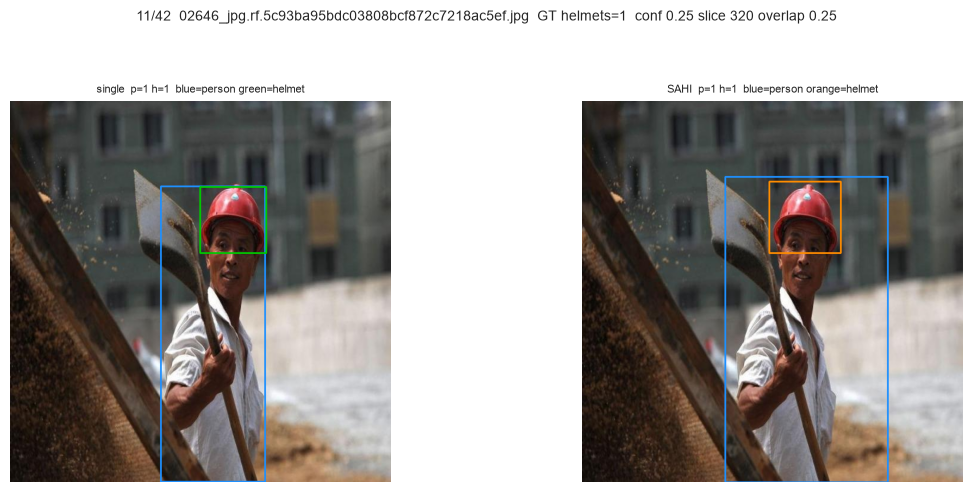

Performing prediction on 9 slices.


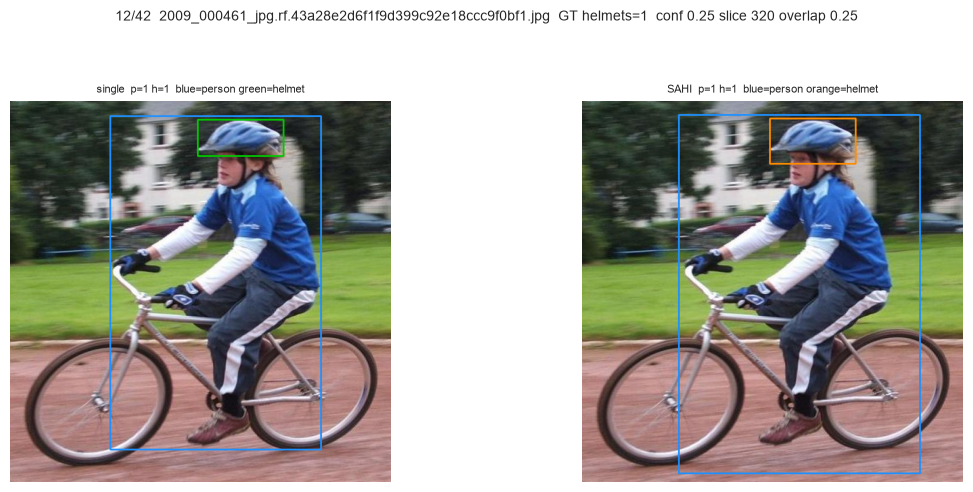

Performing prediction on 9 slices.


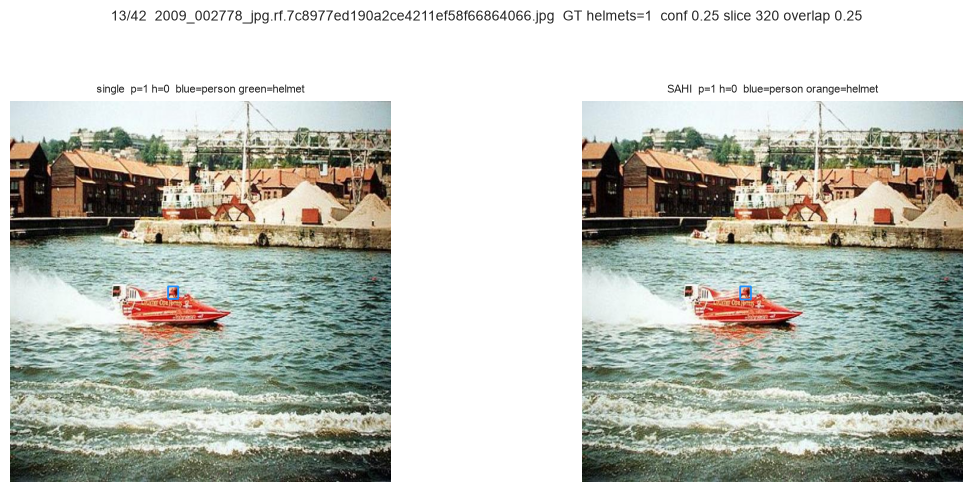

Performing prediction on 9 slices.


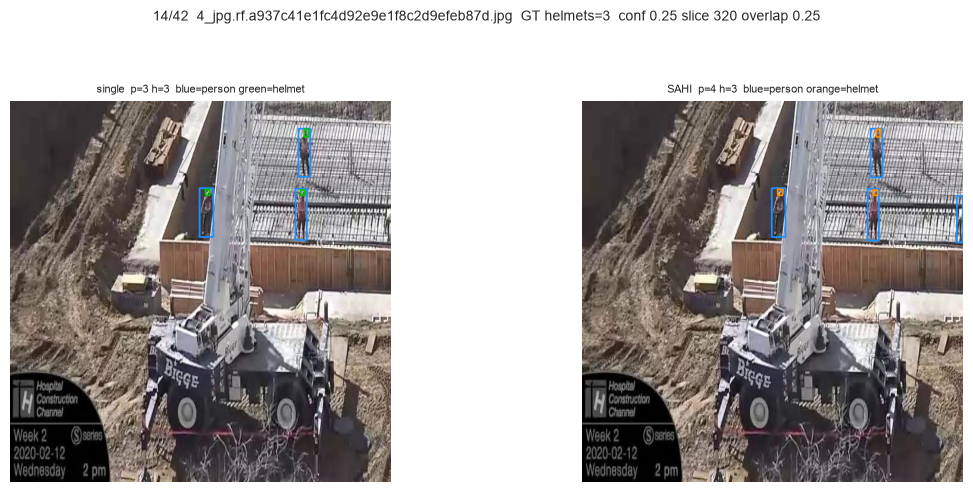

Performing prediction on 9 slices.


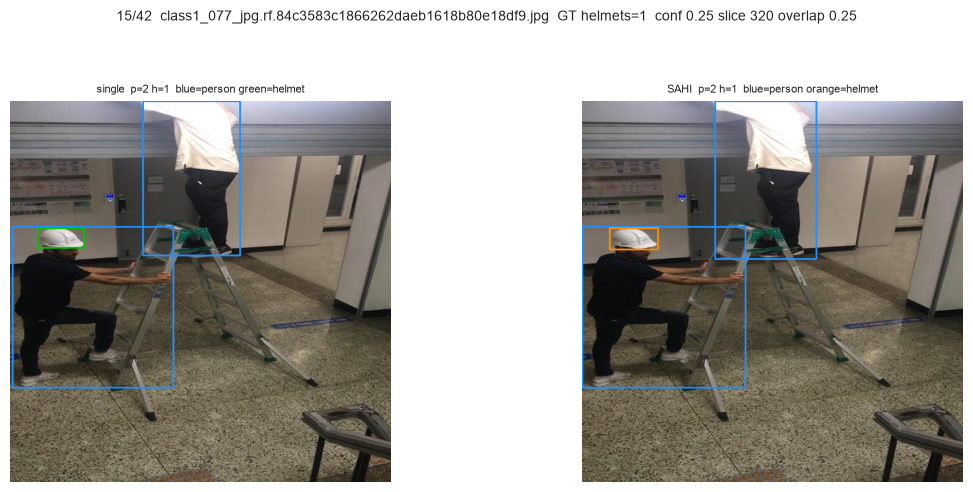

Performing prediction on 9 slices.


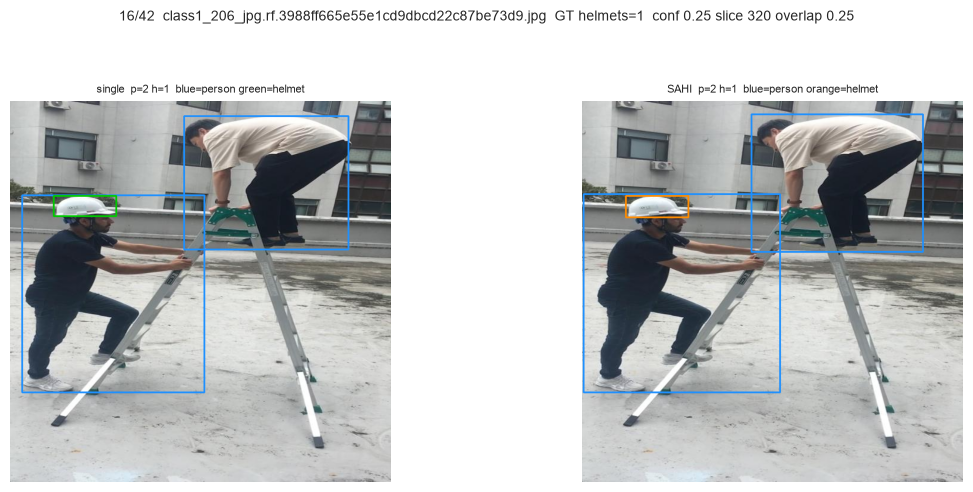

Performing prediction on 9 slices.


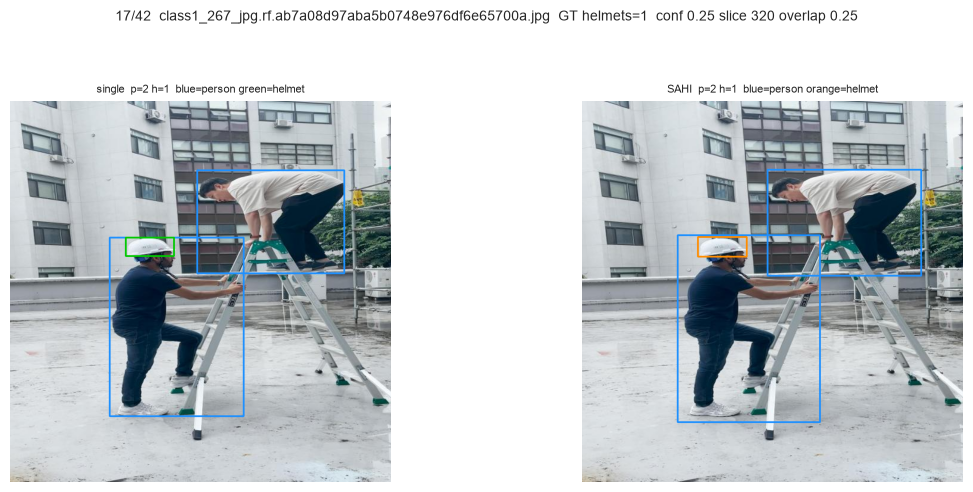

Performing prediction on 9 slices.


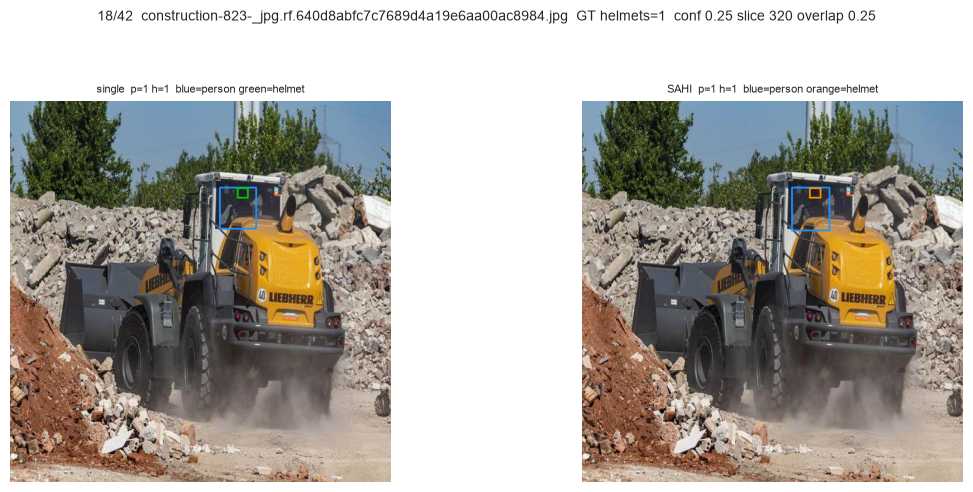

Performing prediction on 9 slices.


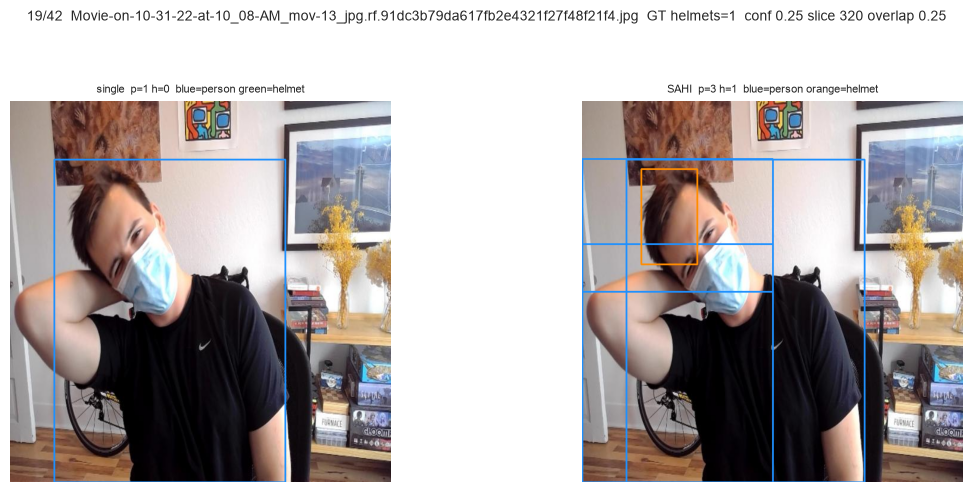

Performing prediction on 9 slices.


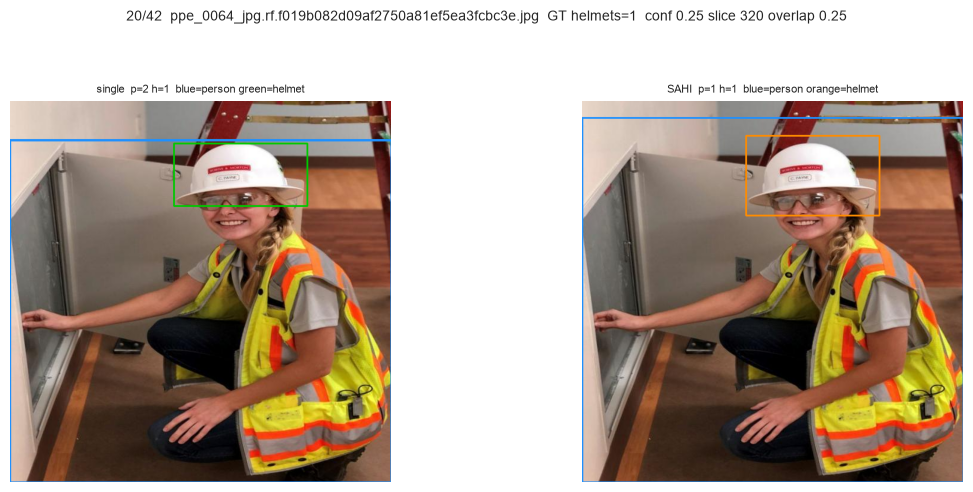

Performing prediction on 9 slices.


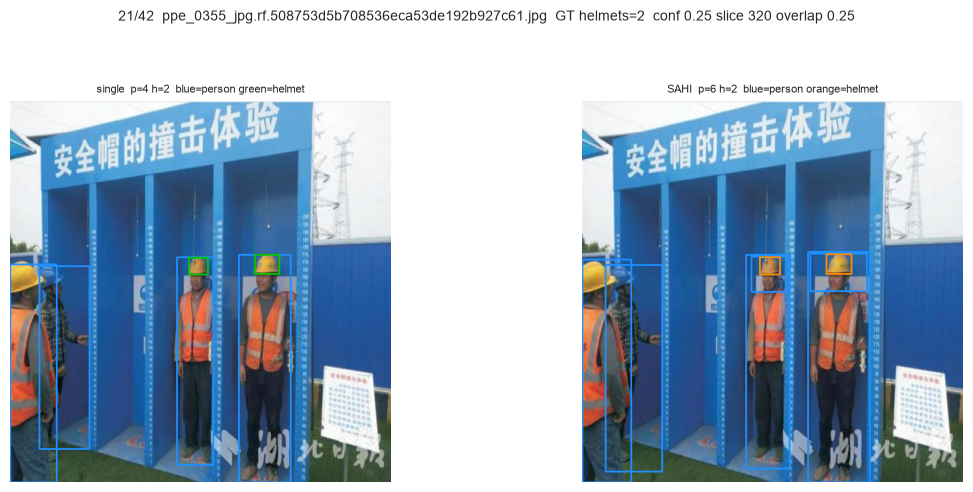

Performing prediction on 9 slices.


In [ ]:
if not IMGS:
    print('no images')
else:
    helmet_imgs = []
    for im in IMGS:
        lab = VALID_DIR / 'labels' / (im.stem + '.txt')
        if lab.exists():
            for line in lab.read_text().splitlines():
                if line.strip() and int(float(line.split()[0])) == 0:
                    helmet_imgs.append(im)
                    break
    print(f'helmet images: {len(helmet_imgs)}/{len(IMGS)} (valid) -> {len(helmet_imgs)} figures  (yolo26m_merged_150e single vs SAHI)')
    if not helmet_imgs:
        print('no helmet images found')
    else:
        yolo = YOLO(str(WEIGHT))
        sm = get_model(WEIGHT, CONF)
        for idx, im in enumerate(helmet_imgs, 1):
            with Image.open(im) as pil:
                base = __import__("numpy").array(pil)
            lab = VALID_DIR / 'labels' / (im.stem + '.txt')
            gt_n = sum(1 for l in lab.read_text().splitlines() if l.strip() and int(float(l.split()[0]))==0) if lab.exists() else 0
            r = yolo(str(im), verbose=False, conf=CONF)[0]
            single_p, single_h = [], []
            if r.boxes is not None:
                for i in range(len(r.boxes)):
                    cid = int(r.boxes.cls[i].item())
                    x1,y1,x2,y2 = r.boxes.xyxy[i].tolist()
                    if cid == PERSON_ID:
                        single_p.append([x1,y1,x2,y2])
                    elif cid == HELMET_ID:
                        single_h.append([x1,y1,x2,y2])
            res = get_sliced_prediction(str(im), sm, slice_height=SLICE, slice_width=SLICE, overlap_height_ratio=OVERLAP, overlap_width_ratio=OVERLAP, perform_standard_pred=True)
            sahi_p = [[pr.bbox.minx, pr.bbox.miny, pr.bbox.maxx, pr.bbox.maxy] for pr in res.object_prediction_list if int(pr.category.id) == PERSON_ID]
            sahi_h = [[pr.bbox.minx, pr.bbox.miny, pr.bbox.maxx, pr.bbox.maxy] for pr in res.object_prediction_list if int(pr.category.id) == HELMET_ID]
            fig, axes = plt.subplots(1, 2, figsize=(12, 5))
            fig.suptitle(f'{idx}/{len(helmet_imgs)}  {im.name}  GT helmets={gt_n}  conf {CONF} slice {SLICE} overlap {OVERLAP}', fontsize=10)
            vis0 = base.copy()
            for x1,y1,x2,y2 in single_p:
                cv2.rectangle(vis0,(int(x1),int(y1)),(int(x2),int(y2)),(30,144,255),2)
            for x1,y1,x2,y2 in single_h:
                cv2.rectangle(vis0,(int(x1),int(y1)),(int(x2),int(y2)),(0,200,0),2)
            axes[0].imshow(vis0)
            axes[0].set_title(f'single  p={len(single_p)} h={len(single_h)}  blue=person green=helmet', fontsize=8)
            axes[0].axis('off')
            vis1 = base.copy()
            for x1,y1,x2,y2 in sahi_p:
                cv2.rectangle(vis1,(int(x1),int(y1)),(int(x2),int(y2)),(30,144,255),2)
            for x1,y1,x2,y2 in sahi_h:
                cv2.rectangle(vis1,(int(x1),int(y1)),(int(x2),int(y2)),(255,140,0),2)
            axes[1].imshow(vis1)
            axes[1].set_title(f'SAHI  p={len(sahi_p)} h={len(sahi_h)}  blue=person orange=helmet', fontsize=8)
            axes[1].axis('off')
            plt.tight_layout(rect=[0,0,1,0.93]); plt.show()
